# Uploading files

In [3]:
from google.colab import files
files.upload()

Saving bbc-text.csv to bbc-text.csv
Saving train_opinion.csv to train_opinion.csv


{'bbc-text.csv': b'category,text\ntech,tv future in the hands of viewers with home theatre systems  plasma high-definition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time.  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices.  one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes  like the us s tivo and the uk s sky+ system  allow people to record  store  play  pause and forward wind tv programmes when they want.  essentially  the technology allows for much more personalised tv

In [49]:
from google.colab import files
files.upload()

Saving test_dataset.csv to test_dataset.csv


{'test_dataset.csv': b'article_content,category\r\n"A key debate after the enactment of three farm-reform laws and the subsequent protests is around the issue of federally-fixed minimum support prices (MSPs), a system guaranteeing farmers assured prices for their produce through procurement. MSP is an obligatory, not a statutory exercise. Farmers have demanded a legislation to prohibit sale of any farm produce below these minimum prices. If the government agrees to this, it is likely they will end their protests against the three new farm reforms.But a law making MSPs the legal floor price defies economic logic. The government sets MSPs for 23 crops, but it is effective only in case of rice and wheat because it buys only these two commodities in sufficiently large quantities. MSPs are an assurance that the government will intervene if market rates fall below that threshold, thereby helping avoid distress sale. This policy was salutary when India faced acute food shortages. Farm policie

In [51]:
import pandas as pd
# Reading the csv file and converting to dataframe

df_features=pd.read_csv("train_opinion.csv")

fintest=pd.read_csv("test_dataset.csv")
df_features

,article_content,category
0,The assassination on Friday of Iran’s leading ...,opinion
1,For a nation prone to frequent lamentation ove...,opinion
2,I have been looking lately at the photos taken...,opinion
3,Even Britain’s worst crisis since the war cann...,opinion
4,The Tulip is a proposed 305-metre high “cultur...,opinion
...,...,...
2317,"People in Portland, Oregon, have protested aga...",opinion
2318,"‘I think being a woman is like being Irish,” w...",opinion
2319,What term do you want to search? Search with g...,opinion
2320,This government may seem posh and metro but th...,opinion


# Pre-processing the data from csv files

In [5]:

# To count number of words in the articles for removing some undesirable rows
import pandas as pd

word_count=[]
for i in range(0,2322):
  temp=df_features.article_content[i].split()
  word_count.append(len(temp))

# Adding word counts to the dataframe and weeding out articles with low word count

#pd_fact = pd.concat([df_politics,df_entertainment,df_sport,df_tech,df_business], axis=0)
df_features['word_count']=word_count
df_features

df1 = df_features[df_features['word_count'] > 100]
df_op=df1.drop('word_count',axis=1).reset_index()


In [6]:
df_opinion=df_op.drop('index',axis=1)
df_opinion

,article_content,category
0,The assassination on Friday of Iran’s leading ...,opinion
1,For a nation prone to frequent lamentation ove...,opinion
2,I have been looking lately at the photos taken...,opinion
3,Even Britain’s worst crisis since the war cann...,opinion
4,The Tulip is a proposed 305-metre high “cultur...,opinion
...,...,...
2099,"Politics is a roller-coaster, with ups and dow...",opinion
2100,Last weekend’s rapid government U-turn over tr...,opinion
2101,"People in Portland, Oregon, have protested aga...",opinion
2102,"‘I think being a woman is like being Irish,” w...",opinion


In [7]:
df_f=pd.read_csv("bbc-text.csv")
df_f["category"].replace({"politics": "fact", "entertainment": "fact","sport":"fact", "business":"fact", "tech":"fact"},inplace=True)
df_f=df_f.rename(columns={"text":"article_content"})
df_f=df_f.sample(frac=1).reset_index().drop(columns='index')
df_fact=df_f[:2104]
df_fact

,category,article_content
0,fact,three djs replace peel radio show the late joh...
1,fact,vickery out of six nations england tight-head ...
2,fact,us insurer marsh cuts 2 500 jobs up to 2 500 j...
3,fact,gadget show heralds mp3 christmas partners of ...
4,fact,web helps collect aid donations the web is hel...
...,...,...
2099,fact,barcelona title hopes hit by loss barcelona s ...
2100,fact,bbc should allow more scrutiny mps have urge...
2101,fact,labour mp praises tory campaign the conservati...
2102,fact,man utd stroll to cup win wayne rooney made a ...


# Classification models without POS tags

### Splitting into training and testing datasets

In [52]:
import pandas as pd

In [53]:
# Splitting for training dataset

X_train_f=df_fact[210:].article_content
X_train_op=df_opinion[210:].article_content
X_train=pd.concat([X_train_f,X_train_op],axis=0)
X_train
y_train_f=df_fact[210:].category
y_train_op=df_opinion[210:].category
y_train=pd.concat([y_train_f,y_train_op],axis=0)

# Splitting final test dataset

X_fintest=fintest.article_content
y_fintest=fintest.category

In [54]:
# Splitting for testing dataset

X_test_f=df_fact[:210].article_content
X_test_f
X_test_op=df_opinion[:210].article_content
X_test=pd.concat([X_test_f,X_test_op],axis=0)
X_test
y_test_f=df_fact[:210].category
y_test_op=df_opinion[:210].category
y_test=pd.concat([y_test_f,y_test_op],axis=0)
y_test

0         fact
1         fact
2         fact
3         fact
4         fact
        ...   
205    opinion
206    opinion
207    opinion
208    opinion
209    opinion
Name: category, Length: 420, dtype: object

## Naive Bayes Classifier
With and without removing stop words and using **unigrams** of the corpus

In [55]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [56]:
from sklearn.feature_extraction.text import TfidfVectorizer #<-- these weights different words in the document based on many features like from,crime etc as per the appearence
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline #<--these is used for information transfer


# Without removing stop words

## On development set

#creating a model based on multinomial naive bayes
model1=make_pipeline(TfidfVectorizer(lowercase=True,ngram_range=(1,1)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function

#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

## On final testing dataset

labels3=model1.predict(X_fintest)

# Removing stop words

## On development set

#creating a model based on multinomial naive bayes
model2=make_pipeline(TfidfVectorizer(lowercase=True,stop_words=set(stopwords.words('english')),ngram_range=(1,1)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final testing dataset

labels4=model2.predict(X_fintest)



### Evaluation metrics

--------Without removing stop words----------
*** On development set***
Accuracy score :  0.9285714285714286
Precision 	 Recall 	 F-score 	 support
(0.9375, 0.9285714285714286, 0.9282051282051281, None)


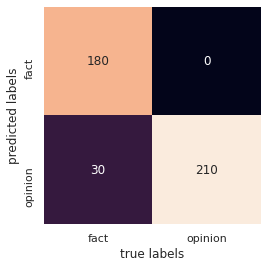

In [58]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On development set***")
mat1=confusion_matrix(y_test,labels1)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t Recall \t F-score \t support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))




--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.6
Precision 	  Recall 	 F-score  support
(0.7777777777777778, 0.6, 0.523809523809524, None)


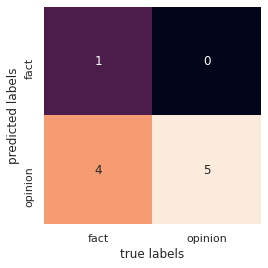

In [61]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
*** On development set***
Accuracy score :  0.9404761904761905
Precision 	 Recall 	 F-score 	 support
(0.9468085106382979, 0.9404761904761905, 0.9402645427392973, None)


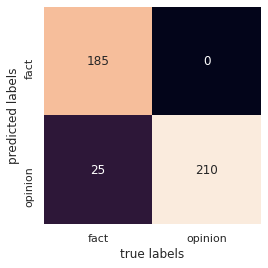

In [62]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On development set***")
mat1=confusion_matrix(y_test,labels2)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t Recall \t F-score \t support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))




--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.6
Precision 	  Recall 	 F-score  support
(0.7777777777777778, 0.6, 0.523809523809524, None)


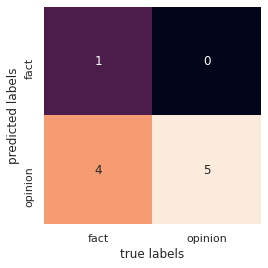

In [64]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




## Naives Bayes Classifier 
With and without removing stop words and using **bigrams**

In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer #<-- these weights different words in the document based on many features like from,crime etc as per the appearence
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline #<--these is used for information transfer



In [65]:
# Without removing stop words

## On development set

#creating a model based on multinomial naive bayes
model1=make_pipeline(TfidfVectorizer(lowercase=True,ngram_range=(2,2)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function
#print(model)
#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

## On final testing dataset

labels3=model1.predict(X_fintest)

# Removing stop words

## On development set

#creating a model based on multinomial naive bayes
model2=make_pipeline(TfidfVectorizer(lowercase=True,stop_words=set(stopwords.words('english')),ngram_range=(2,2)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final test dataset

labels4=model2.predict(X_fintest)

### Evaluation metrics

------WIthout removing stop words-------
Accuracy score :  0.9071428571428571
Precision 		 Recall 		 F-score  support
(0.9216867469879519, 0.9071428571428571, 0.9063352375070763, None)


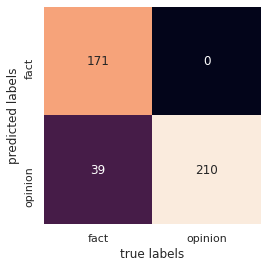

In [17]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score

# Without removing stop words

print("------WIthout removing stop words-------")
mat=confusion_matrix(y_test,labels1)
sns.heatmap(mat.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))


--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.7
Precision 	  Recall 	 F-score  support
(0.8125, 0.7, 0.6703296703296704, None)


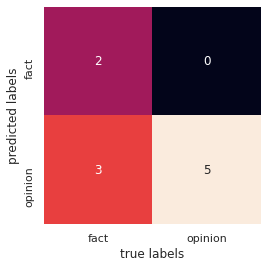

In [66]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
Accuracy score :  0.9857142857142858
Precision 		 Recall 		 F-score  support
(0.9858905725433265, 0.9857142857142858, 0.9857129898403484, None)


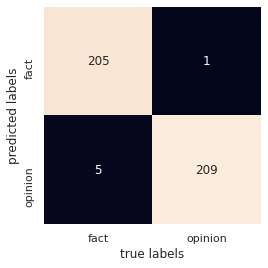

In [18]:
# Metrics after removing stop words

print("--------After removing stop words----------")
mat2=confusion_matrix(y_test,labels2)
sns.heatmap(mat2.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))


--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.9
Precision 	  Recall 	 F-score  support
(0.9166666666666667, 0.9, 0.898989898989899, None)


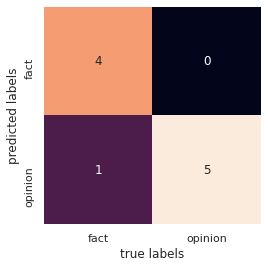

In [67]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




## Naive Bayes Classifier 
With and without removing stop words and using **trigrams**

In [68]:
# Without removing stop words

## On development set

#creating a model based on multinomial naive bayes
model1=make_pipeline(TfidfVectorizer(lowercase=True,ngram_range=(3,3)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function
#print(model)
#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

## On final testing dataset

labels3=model1.predict(X_fintest)

# Removing stop words

## On development set

#creating a model based on multinomial naive bayes
model2=make_pipeline(TfidfVectorizer(lowercase=True,stop_words=set(stopwords.words('english')),ngram_range=(3,3)),MultinomialNB())#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final training dataset

labels4=model2.predict(X_fintest)


### Evaluation metrics

-----Without removing stop words------
Accuracy score :  0.95
Precision 	 Recall 	 F-score 	 support
(0.9545454545454545, 0.95, 0.9498746867167919, None)


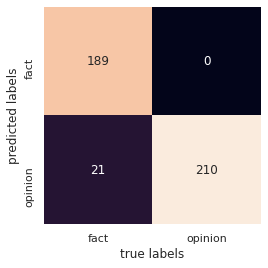

In [69]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
print("-----Without removing stop words------")
mat=confusion_matrix(y_test,labels1)
sns.heatmap(mat.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t Recall \t F-score \t support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))


--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.9
Precision 	  Recall 	 F-score  support
(0.9166666666666667, 0.9, 0.898989898989899, None)


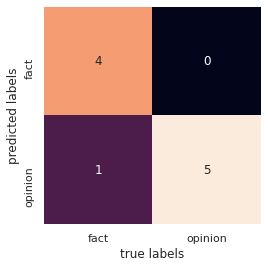

In [70]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
Accuracy score :  0.9595238095238096
Precision 		 Recall 		 F-score  support
(0.9597844583096993, 0.9595238095238096, 0.9595180722891565, None)


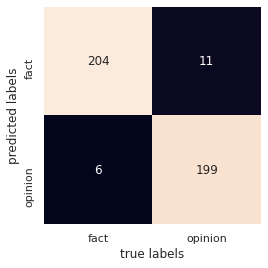

In [71]:
# Metrics after removing stop words

print("--------After removing stop words----------")
mat2=confusion_matrix(y_test,labels2)
sns.heatmap(mat2.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))


--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.8
Precision 	  Recall 	 F-score  support
(0.8571428571428571, 0.8, 0.7916666666666666, None)


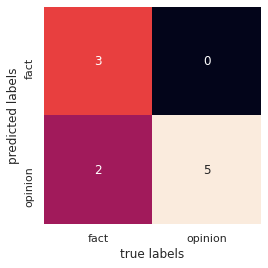

In [72]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




## KNN Classification
With our without removing stop words

In [73]:
from sklearn.feature_extraction.text import TfidfVectorizer #<-- these weights different words in the document based on many features like from,crime etc as per the appearence
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline #<--these is used for information transfer
## Without removing stop words

# On development set

#creating a model based on KNN
model1=make_pipeline(TfidfVectorizer(),KNeighborsClassifier(n_neighbors=3))#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function
#print(model)

#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

# On final testing dataset

labels3=model1.predict(X_fintest)

# Removing stop words

## On development set

#creating a model based on KNN
model2=make_pipeline(TfidfVectorizer(stop_words=set(stopwords.words('english'))),KNeighborsClassifier(n_neighbors=3))#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final testing dataset

labels4=model2.predict(X_fintest)






### Evaluation metrics

-----Without removing stop words------
Accuracy score :  0.9071428571428571
Precision 		 Recall 		 F-score  support
(0.9174513496547395, 0.9071428571428571, 0.9065660454848813, None)


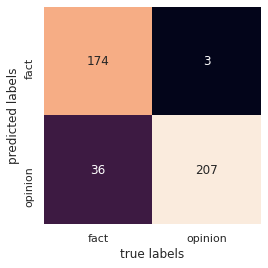

In [74]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
print("-----Without removing stop words------")
mat=confusion_matrix(y_test,labels1)
sns.heatmap(mat.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))


--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.7
Precision 	  Recall 	 F-score  support
(0.8125, 0.7, 0.6703296703296704, None)


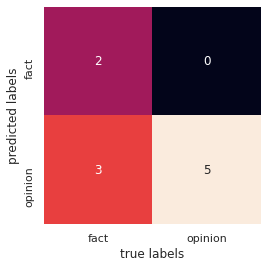

In [75]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
Accuracy score :  0.9523809523809523
Precision 		 Recall 		 F-score  support
(0.9525451410942746, 0.9523809523809523, 0.9523766328011612, None)


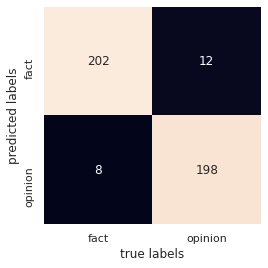

In [76]:
# Metrics after removing stop words

print("--------After removing stop words----------")
mat2=confusion_matrix(y_test,labels2)
sns.heatmap(mat2.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))


--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.6
Precision 	  Recall 	 F-score  support
(0.6, 0.6, 0.6, None)


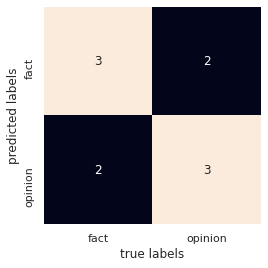

In [77]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




## Random forest
With or without removing stopwords 

In [79]:
from sklearn.feature_extraction.text import TfidfVectorizer #<-- these weights different words in the document based on many features like from,crime etc as per the appearence
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline #<--these is used for information transfer

## Without using stop words

# On development set 

#creating a model based on Random forest
model1=make_pipeline(TfidfVectorizer(),RandomForestClassifier(n_estimators=200,max_depth=2,random_state=0))#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function
#print(model)

#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

# On final test dataset

labels3=model1.predict(X_fintest)


# Removing stop words

## On development set

#creating a model based on Random forest
model2=make_pipeline(TfidfVectorizer(stop_words=set(stopwords.words('english'))),RandomForestClassifier(n_estimators=200,max_depth=2,random_state=0)) 

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final test dataset

labels4=model2.predict(X_fintest)


### Evaluation metrics

****without removing stop words****
Accuracy score :  0.9357142857142857
Precision 		 Recall 		 F-score  support
(0.9361989512156365, 0.9357142857142857, 0.9356964236097329, None)


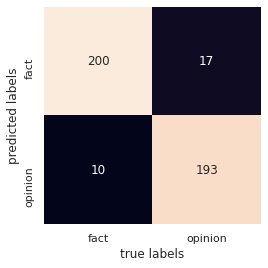

In [80]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
print("****without removing stop words****")
mat=confusion_matrix(y_test,labels1)
sns.heatmap(mat.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))


--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.8
Precision 	  Recall 	 F-score  support
(0.8571428571428571, 0.8, 0.7916666666666666, None)


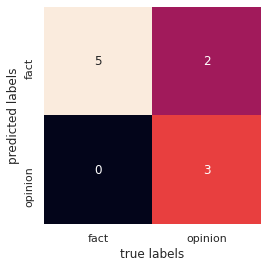

In [81]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
Accuracy score :  0.9595238095238096
Precision 		 Recall 		 F-score  support
(0.961880341880342, 0.9595238095238096, 0.9594721157939549, None)


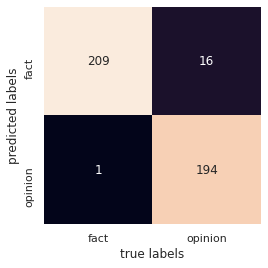

In [44]:
# Metrics after removing stop words

print("--------After removing stop words----------")
mat2=confusion_matrix(y_test,labels2)
sns.heatmap(mat2.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))


--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.7
Precision 	  Recall 	 F-score  support
(0.8125, 0.7, 0.6703296703296704, None)


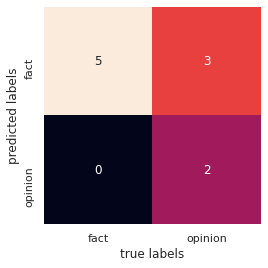

In [82]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




## Support Vector Classification(SVC)

In [83]:
from sklearn.feature_extraction.text import TfidfVectorizer #<-- these weights different words in the document based on many features like from,crime etc as per the appearence
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline #<--these is used for information transfer
## Without removing stop words

# On development set

#creating a model based on SVM
model1=make_pipeline(TfidfVectorizer(),SVC(gamma='scale',C=1.0,kernel='rbf'))#<--the information we are getting in TfidfVectorizer is pumped in MultinomialNM() using make_pipeline function
#print(model)

#training the model with the train data
model1.fit(X_train,y_train)

#creating the label for test data
labels1=model1.predict(X_test)
#print(labels)

# On final testing dataset

labels3=model1.predict(X_fintest)

# Removing stop words

## On development set

#creating a model based on Random forest
model2=make_pipeline(TfidfVectorizer(stop_words=set(stopwords.words('english'))),SVC(gamma='scale',C=1.0,kernel='rbf')) 

#training the model with the train data
model2.fit(X_train,y_train)

#creating the label for test data
labels2=model2.predict(X_test)

## On final testing dataset

labels4=model2.predict(X_fintest)



### Evaluation metrics

-----Without removing stop words------
Accuracy score :  0.9880952380952381
Precision 		 Recall 		 F-score  support
(0.9881063062654482, 0.9880952380952381, 0.9880951706075433, None)


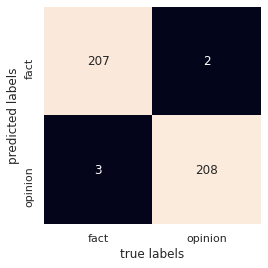

In [84]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
print("-----Without removing stop words------")
mat=confusion_matrix(y_test,labels1)
sns.heatmap(mat.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels1))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels1,average='weighted'))


--------Without removing stop words----------
*** On final testing dataset set***
Accuracy score :  0.8
Precision 	  Recall 	 F-score  support
(0.8571428571428571, 0.8, 0.7916666666666666, None)


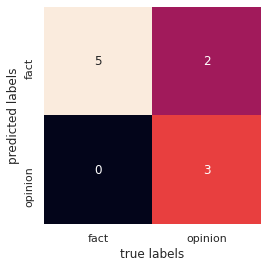

In [85]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support
# Metrics for without removing stop words
print("--------Without removing stop words----------")
print("*** On final testing dataset set***")
mat1=confusion_matrix(y_fintest,labels3)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels3))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels3,average='weighted'))




--------After removing stop words----------
Accuracy score :  0.9952380952380953
Precision 		 Recall 		 F-score  support
(0.9952380952380953, 0.9952380952380953, 0.9952380952380953, None)


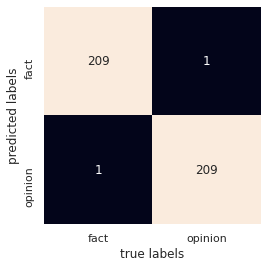

In [86]:
# Metrics after removing stop words

print("--------After removing stop words----------")
mat2=confusion_matrix(y_test,labels2)
sns.heatmap(mat2.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_test,labels2))
print("Precision \t\t Recall \t\t F-score  support")
print(precision_recall_fscore_support(y_test,labels2,average='weighted'))


--------After removing stop words----------
*** On final testing set***
Accuracy score :  0.9
Precision 	  Recall 	 F-score  support
(0.9166666666666667, 0.9, 0.898989898989899, None)


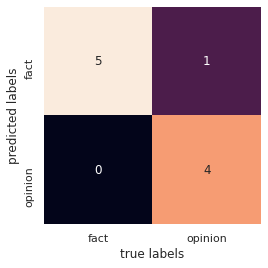

In [87]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score
from sklearn.metrics import precision_recall_fscore_support

print("--------After removing stop words----------")
print("*** On final testing set***")
mat1=confusion_matrix(y_fintest,labels4)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['fact','opinion'],yticklabels=['fact','opinion'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(y_fintest,labels4))
print("Precision \t  Recall \t F-score  support")
print(precision_recall_fscore_support(y_fintest,labels4,average='weighted'))




# Classification models with POS Tags

## POS Tagging our datasets

In [ ]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
X_train=X_train.reset_index().drop(columns='index')
y_train=y_train.reset_index().drop(columns='index')
X_test=X_test.reset_index().drop(columns='index')
y_test=y_test.reset_index().drop(columns='index')

X_train1=X_train.values.tolist()
X_test1=X_test.values.tolist()



['_JJ ban_NN hits_VBZ half_PDT -_: life_NN 2_CD pirates_NNS hard_JJ about_IN 20_CD 000_CD people_NNS have_VBP been_VBN banned_VBN from_IN playing_VBG the_DT half_NN -_: life_NN 2_CD game_NN ._. game_NN maker_NN valve_NN shut_VBD down_RP the_DT online_JJ accounts_NNS of_IN the_DT players_NNS because_IN it_PRP had_VBD evidence_NN that_IN their_PRP$ copy_NN of_IN the_DT game_NN had_VBD been_VBN obtained_VBN illegally_RB ._. copies_NNS of_IN half_NN -_: life_NN 2_CD had_VBD been_VBN circulating_VBG on_IN file_NN -_: sharing_VBG systems_NNS soon_RB after_IN it_PRP was_VBD officially_RB released_VBN ._. experts_NNS said_VBD the_DT success_NN of_IN the_DT half_NN -_: life_NN 2_CD anti_JJ -_: piracy_NN system_NN might_MD tempt_VB other_JJ game_NN makers_NNS into_IN creating_VBG their_PRP$ own_JJ version_NN ._. half_NN -_: life_NN 2_CD was_VBD officially_RB released_VBN on_IN 16_CD november_NNS but_CC before_IN gamers_NNS could_MD get_VB to_TO grips_VB with_IN the_DT long_JJ -_: awaited_VBN tit

In [ ]:
X_train_pos=[]
X_test_pos=[]

# POS tagging training dataset

for i in range(0,3788):
  train_temp=''
  wpt = nltk.WordPunctTokenizer()
  text1 = wpt.tokenize(str(X_train1[i]))
  text_tagged1 = nltk.pos_tag(text1)
  new_text1 = []
  
  for word in text_tagged1:
    new_text1.append(word[0] + "_" + word[1])

  train_temp=' '.join(new_text1)
  X_train_pos.append(train_temp)

 
  
# POS tagging test dataset

for i in range(0,420):
  test_temp=''
  wpt = nltk.WordPunctTokenizer()
  text2= wpt.tokenize(str(X_test1[i]))
  text_tagged2 = nltk.pos_tag(text2)
  new_text2=[]
  for word in text_tagged2:
     new_text2.append(word[0]+"_"+word[1])

  test_temp = ' '.join(new_text2)
  X_test_pos.append(test_temp)




## Downloading the tagged datasets and labels for classification in another notebook

In [ ]:
import pandas as pd
import numpy as np

X_train_tagged = pd.DataFrame(X_train_pos, columns = ['article_content'])
X_test_tagged = pd.DataFrame(X_test_pos, columns=["article_content"])


(3788, 1)

In [ ]:
from google.colab import files
X_train_tagged.to_csv('X_train_tagged.csv',index=False)
X_test_tagged.to_csv('X_test_tagged.csv',index=False)
files.download('X_train_tagged.csv')
files.download("X_test_tagged.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
y_train.to_csv('y_train.csv',index=False)
y_test.to_csv('y_test.csv',index=False)
files.download('y_train.csv')
files.download("y_test.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>